# Perception of the Covid-19 vaccine through Twitter Sentiment analysis

The main purpose of this project is to measure the public response to the COVID-19 vaccine with sentiment analysis. 
In order to analyze the public opinions and emotions related to the vaccine during the pandemic, I will be utilizing recent Twitter streaming data

* We try to answer What is the public perception regarding Covid-19 vaccination? 
* Which regions are pro or anti vaccine based on Twitter data?



Install Necessary Packages

In [2]:
import tweepy
import sys
from tweepy import Stream
from tweepy import OAuthHandler
from tweepy.streaming import StreamListener
import time
import datetime 
from tqdm import tqdm
import pandas as pd

In [52]:
import numpy as np
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import string
from sklearn.feature_extraction.text import CountVectorizer
import nltk 
from nltk.corpus import stopwords
import re
pd.set_option('display.max_colwidth', 100)
import unicodedata
import plotly.graph_objects as go
import seaborn as sns
from nltk import bigrams
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from plotly.subplots import make_subplots
from nltk.util import ngrams

Extract tweets based on certain topics from Twitter API using the Tweepy library


In [3]:
#Twitter developer account credentials

consumer_key="ArvY8sU6HDZSuGk9nMADCd1Za"
consumer_secret="WhhxixavlxGgAsr6nHwwjmsEDdNCBGCC2LxHJWLl0Tho5OcTKe"
access_token="2415738176-GCKuN5W25sftYfjOMXMgA1UXaS6kHkl8gYnMWGm"
access_token_secret="GBzgC4NrDA4XhCf7CS6md1zQuNmm0o458rhJSqfz3PFki"
BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAB%2FTNwEAAAAAVJ9eZ2QOZtV6XLvnSyKpFLXsSvM%3DxZ6H7C5dNsJTvzttvypgHnedYpByZ9bUOgvxQXXLVHf2TdAEFU"

#Switching to application authentication
auth = tweepy.OAuthHandler(consumer_key,consumer_secret)
auth.set_access_token(access_token, access_token_secret)
auth.secure = True

#Setting up api wrapper, using authentication only
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

#Error handling
if (not api):
    print ("Problem connecting to API")

#You can check how many queries you have left using rate_limit_status() method
api.rate_limit_status()['resources']['search']

# if (not api):
#     print("Authentication failed!")
#     sys.exit(-1)

{'/search/tweets': {'limit': 180, 'remaining': 180, 'reset': 1620265080}}

In [4]:
#Switching to application authentication
auth = tweepy.AppAuthHandler(consumer_key, consumer_secret)

#Setting up new api wrapper, using authentication only
api = tweepy.API(auth, wait_on_rate_limit=True,wait_on_rate_limit_notify=True)

#Error handling
if (not api):
    print ("Problem Connecting to API")

In [5]:
#Maximum number of tweets we want to collect 
number_tweets= 1000
#The twitter Search API allows up to 100 tweets per query
tweetsPerQry = 100

#search_words
search_words= '''covidvaccine OR vaccination 
                   AND coronavirus OR covid
                   AND pro OR antivax OR antivaxxer
                   OR vaccineswork '''

retweet_filter='-filter:retweets'

q=search_words+retweet_filter
date_since= "2020-12-08"
#date_until= "2021-04-14"
tweetCount = 0
geo =[]
tweets=[]
likes=[]
user=[]
location= []
date=[]

for tweet in tweepy.Cursor(api.search, q= q,lang="en",since= date_since, tweet_mode='extended').items(number_tweets) :
        geo.append(tweet.geo)
        tweets.append(tweet.full_text)
        likes.append(tweet.favorite_count)
        user.append(tweet.user.screen_name)
        location.append(tweet.user.location)
        date.append(tweet.created_at)
        tweetCount += 1
    #Display how many tweets we have collected
print("Downloaded {0} tweets".format(tweetCount))

vacc_tweet_5= pd.DataFrame({'geo':geo,'tweets':tweets,'likes':likes,'user':user,'location':location,'date': date})


Downloaded 704 tweets


In [6]:
vacc_tweet_5.to_csv('/Users/neviyaprakash/Desktop/UMD MIM/Spring 2021/INST 767 Big data/project/vacc_tweet.csv',index=False)


Also used the kaggle data set on covid vaccine : https://www.kaggle.com/kaushiksuresh147/covidvaccine-tweets

Loading the combined tweets

In [7]:
tweet = pd.read_csv('/Users/neviyaprakash/Desktop/UMD MIM/Spring 2021/INST 767 Big data/project/CovidVaccine.csv')
tweet

,text,like,user,location,date
0,Just heard that some antivax are planning to f...,0,_mrsyl,"California, USA",4/11/21 20:48
1,Another good day in terms of covid in the UK. ...,0,SustainUKorg,UK,4/11/21 20:46
2,"PRO/EAFR&gt; COVID-19 update (46): Africa, vac...",0,ProMED_EAFR,Anglophone Africa,4/11/21 20:31
3,Hey @statnews: the EEOC issued guidance in DEC...,0,FT__Dan,"Seattle, WA 🇺🇸",4/11/21 19:20
4,@escape1979uk @ToneVays Wait so you’re admitti...,0,Upstart555Mark,NaN,4/11/21 16:48
...,...,...,...,...,...
50346,It's #WorldImmunizationWeek and there's even m...,0,wregional,"Fayetteville, AR",4/26/21 15:45
50347,India_fight_corona\n#coronavirus #COVID19 #Cor...,1,RudraSi69670985,"Indore, India",4/26/21 15:39
50348,Please show up for your 2nd Covid vaccination....,423,lisareynaloe,Texas,4/26/21 15:38
50349,We're making sure nobody is missed and vaccine...,9,NHSscw,"England, United Kingdom",4/26/21 15:30


In [8]:
print('Dataset size:',tweet.shape)
print('Columns are:',tweet.columns)

Dataset size: (50351, 5)
Columns are: Index(['text', 'like', 'user', 'location', 'date'], dtype='object')


In [9]:
tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50351 entries, 0 to 50350
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   text      50351 non-null  object
 1   like      50351 non-null  int64 
 2   user      50351 non-null  object
 3   location  38047 non-null  object
 4   date      50351 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.9+ MB


In [10]:
#Covert Date D type object to Date type
tweet['date'] = pd.to_datetime(tweet['date'])

In [13]:
# All tweets from December 2020 to May 2021.
tweet.date.value_counts()

2021-04-14 15:30:00    291
2021-04-14 15:31:00    245
2021-04-14 15:23:00    231
2021-04-14 15:13:00    216
2021-04-14 15:27:00    214
                      ... 
2021-03-10 17:13:00      1
2021-01-03 22:50:00      1
2021-03-08 21:16:00      1
2021-03-16 10:05:00      1
2021-02-12 12:32:00      1
Name: date, Length: 31374, dtype: int64

In [12]:
print(min(tweet['date']))
print(max(tweet['date']))

2020-12-12 11:55:00
2021-05-04 14:18:00


In [14]:
#Extract only the month and year from date & Time
tweet['month_year'] = tweet['date'].dt.strftime('%B-%Y')

In [15]:
print(min(tweet['month_year']))
print(max(tweet['month_year']))

April-2021
May-2021


## Exploratory Data Analysis 
Checking for missing values

We see that Location column has 24.4% of Null values from a total of 50351 tweets

In [16]:
missing_values = pd.DataFrame()
missing_values['column'] = tweet.columns

missing_values['percent'] = [round(100* tweet[col].isnull().sum() / len(tweet), 2) for col in tweet.columns]
missing_values = missing_values.sort_values('percent')
missing_values = missing_values[missing_values['percent']>0]
missing_values.head()

,column,percent
3,location,24.44


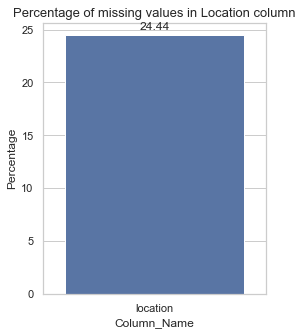

In [19]:
plt.figure(figsize=(4, 5))
sns.set(style='whitegrid')
splot=sns.barplot(x='column', y='percent', data= missing_values)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("Column_Name")
plt.ylabel("Percentage")
plt.title("Percentage of missing values in Location column",size=13)
plt.show()

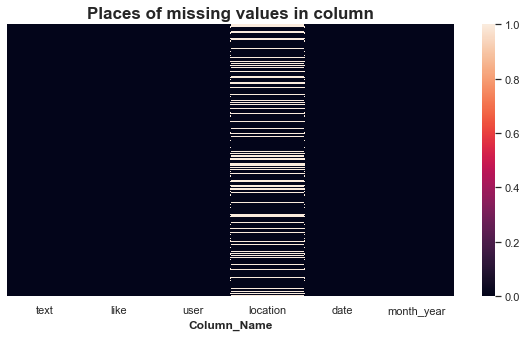

In [20]:
plt.figure(figsize=(10, 5))
sns.heatmap(tweet.isnull(), cbar=True, yticklabels=False)
plt.xlabel("Column_Name", size=12, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()

## Location Exploratory Analysis

In [21]:
#Top Location of tweets
loc_analysis = pd.DataFrame(tweet['location'].value_counts().sort_values(ascending=False))
loc_analysis = loc_analysis.rename(columns={'location':'count'})

In [23]:
data = {
   "values": loc_analysis['count'][:15],
   "labels": loc_analysis.index[:15],
   "domain": {"column": 0},
   "name": "Location Name",
   "hoverinfo":"label+percent+name",
   "hole": .3,
   "type": "pie"
}
layout = go.Layout(title="<b>Ratio of Location</b>", legend=dict(x=0.1, y=1.1, orientation="h"))

data = [data]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title_x=0.5)
fig.show()

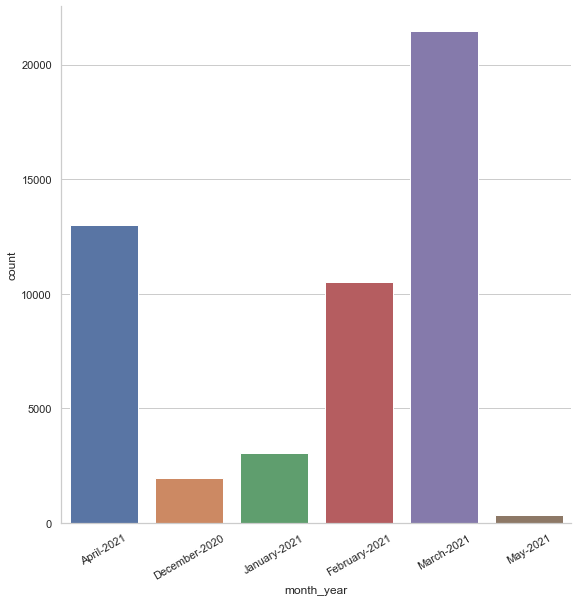

In [24]:
#Number of tweets by Month
g= sns.catplot("month_year", data=tweet, kind="count", height=8)
g.set_xticklabels(rotation=30)

Number of tweets in March 2021 is highest


In [26]:
#Top 10 location of tweets
Top_Location_Of_tweet= tweet['location'].value_counts().head(10)

sns.set(rc={'figure.figsize':(12,8)})
sns.set_style('white')
Top_Location_Of_tweet.head(10)

India                             1118
Toronto, Canada  and Worldwide     613
United States                      566
New Delhi, India                   493
London, England                    415
Beijing, China                     334
London                             316
Mumbai, India                      304
Canada                             282
Los Angeles, CA                    273
Name: location, dtype: int64

In [27]:
#convert to dataframe
Top_Location_Of_tweet_df=pd.DataFrame(Top_Location_Of_tweet)
Top_Location_Of_tweet_df.reset_index(inplace=True)
Top_Location_Of_tweet_df.rename(columns={'index':'Location', 'location':'Location_Count'}, inplace=True)
Top_Location_Of_tweet_df

,Location,Location_Count
0,India,1118
1,"Toronto, Canada and Worldwide",613
2,United States,566
3,"New Delhi, India",493
4,"London, England",415
5,"Beijing, China",334
6,London,316
7,"Mumbai, India",304
8,Canada,282
9,"Los Angeles, CA",273


[Text(0, 0, 'India'),
 Text(0, 0, 'Toronto, Canada  and Worldwide'),
 Text(0, 0, 'United States'),
 Text(0, 0, 'New Delhi, India'),
 Text(0, 0, 'London, England'),
 Text(0, 0, 'Beijing, China'),
 Text(0, 0, 'London'),
 Text(0, 0, 'Mumbai, India'),
 Text(0, 0, 'Canada'),
 Text(0, 0, 'Los Angeles, CA')]

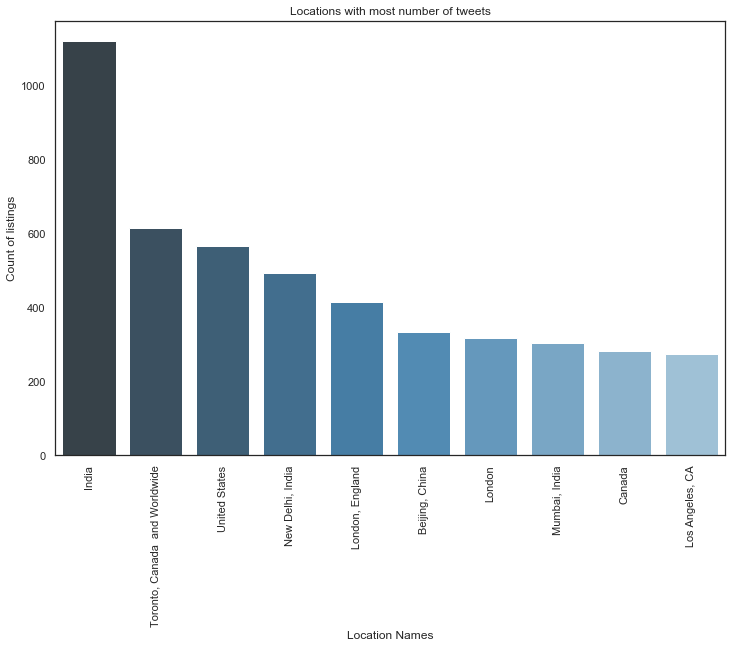

In [31]:
viz_1=sns.barplot(x="Location", y="Location_Count", data=Top_Location_Of_tweet_df, palette='Blues_d')
viz_1.set_title('Locations with most number of tweets')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Location Names')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=90)

### Creating Word Cloud Visualization

In [32]:
#Considering only the tweets
df = pd.DataFrame(tweet[['user', 'text']])
df.head()

,user,text
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr"
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...


In [33]:
tweet_all = " ".join(review for review in df.text)
print ("There are {} words in the combination of all tweets.".format(len(tweet_all)))

There are 7408472 words in the combination of all tweets.


In [34]:
# Create and generate a word cloud image:
wordcloud_all = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_all)

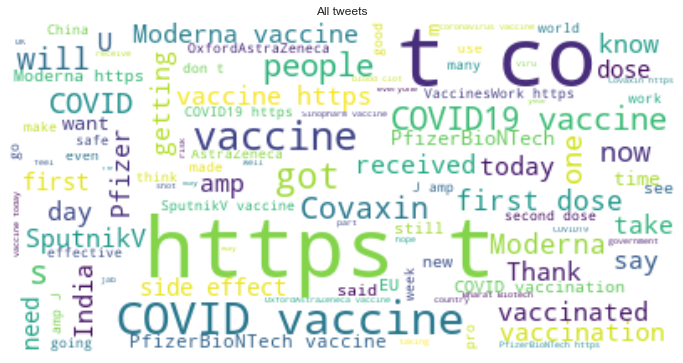

In [35]:
#plot wordcloud
plt.figure()
plt.imshow(wordcloud_all, interpolation="bilinear")
plt.title("All tweets")
plt.axis("off")
plt.show()

## Pre-processing text data
Most of the text data are cleaned by following below steps.

* Remove punctuations
* Tokenization - Converting a sentence into list of words
* Remove stopwords
* Lemmatization/stemming - Tranforming any form of a word to its root word

In [36]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [37]:
#Remove Punctuation
def remove_punct(twt):
    twt  = "".join([char for char in twt if char not in string.punctuation])    
    twt1 = re.sub('[0-9]+', '', twt)
    #remove mentions@
    twt1 = re.sub(r'@[A-Za-z0-9_]+', '', twt1)
    # Remove hashtags
    twt1 = re.sub(r'#', '', twt1)
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    no_url = url_pattern.sub(r'', twt1)
    text = (unicodedata.normalize('NFKD', no_url).encode('ascii', 'ignore').decode('utf-8', 'ignore'))
    return text

df['tweet_punct'] = df['text'].apply(lambda x: remove_punct(x.lower()))
df.head(10)

,user,text,tweet_punct
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",proeafrgt covid update africa vaccination httpstcotktwgmhvr
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...
5,MattBConnects,Just had my vaccine and was told its not activated until you announce it on social media 😉 \n\nM...,just had my vaccine and was told its not activated until you announce it on social media \n\nma...
6,Erst_Officer,"Still @ 15%, #Georgia continues to lag the rest of the nation in administered vaccines. I guess...",still georgia continues to lag the rest of the nation in administered vaccines i guess the ge...
7,mainak_bardhan,As our knowledge is evolving about #COVID19 and #CovidVaccine keeping an eye on these will surel...,as our knowledge is evolving about covid and covidvaccine keeping an eye on these will surely he...
8,FKarlEsc,Vaccination to protect against COVID-19 is non-obligatory but very important. If you are in the ...,vaccination to protect against covid is nonobligatory but very important if you are in the centr...
9,sophsweet,"Seeing as COVID-19 variants predominantly came from South Africa, Brazil and Kent in the United ...",seeing as covid variants predominantly came from south africa brazil and kent in the united king...


There are 6782441 words in the combination of all tweets.


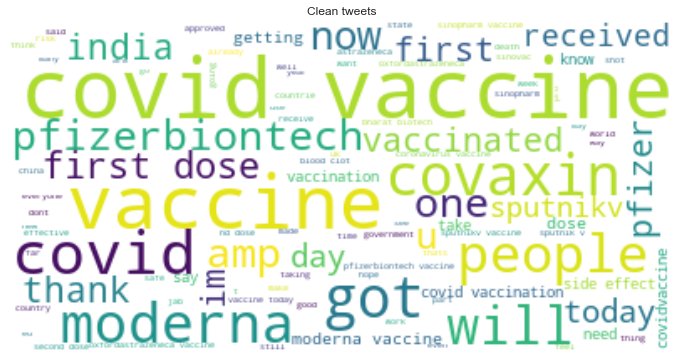

In [38]:
# Create and generate a word cloud image:
tweet_clean = " ".join(review for review in df.tweet_punct)
print ("There are {} words in the combination of all tweets.".format(len(tweet_clean)))

wordcloud_all = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_clean)
#plot wordcloud
plt.figure()
plt.imshow(wordcloud_all, interpolation="bilinear")
plt.title("Clean tweets")
plt.axis("off")
plt.show()

In [39]:
#Tweet Tokenization
def tokenization(twt):
    twt = re.split('\W+', twt)
    return twt

df['Tweet_tokenized'] = df['tweet_punct'].apply(lambda x: tokenization(x))
df.head()

,user,text,tweet_punct,Tweet_tokenized
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...,"[just, heard, that, some, antivax, are, planning, to, fake, the, covid, vaccination, cards, and,..."
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...,"[another, good, day, in, terms, of, covid, in, the, uk, record, nd, jabs, and, therefore, full, ..."
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",proeafrgt covid update africa vaccination httpstcotktwgmhvr,"[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]"
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...,"[hey, statnews, the, eeoc, issued, guidance, in, december, saying, that, no, current, law, would..."
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...,"[escapeuk, tonevays, wait, so, youre, admitting, that, the, covid, vaccine, doesnt, workso, that..."


In [40]:
#Removing stopwords
def remove_stopwords(twt):
    stopword = nltk.corpus.stopwords.words('english') 
    twt = [word for word in twt if word not in stopword]
    return twt
    
df['tweet_nonstop'] = df['Tweet_tokenized'].apply(lambda x: remove_stopwords(x))
#df.drop('tweet_nonstop2', axis=1)
df.head(10)

,user,text,tweet_punct,Tweet_tokenized,tweet_nonstop
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...,"[just, heard, that, some, antivax, are, planning, to, fake, the, covid, vaccination, cards, and,...","[heard, antivax, planning, fake, covid, vaccination, cards, guess, republicans]"
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...,"[another, good, day, in, terms, of, covid, in, the, uk, record, nd, jabs, and, therefore, full, ...","[another, good, day, terms, covid, uk, record, nd, jabs, therefore, full, vaccination, deaths, t..."
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",proeafrgt covid update africa vaccination httpstcotktwgmhvr,"[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]","[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]"
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...,"[hey, statnews, the, eeoc, issued, guidance, in, december, saying, that, no, current, law, would...","[hey, statnews, eeoc, issued, guidance, december, saying, current, law, would, prohibit, employe..."
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...,"[escapeuk, tonevays, wait, so, youre, admitting, that, the, covid, vaccine, doesnt, workso, that...","[escapeuk, tonevays, wait, youre, admitting, covid, vaccine, doesnt, workso, thats, keep, nonvac..."
5,MattBConnects,Just had my vaccine and was told its not activated until you announce it on social media 😉 \n\nM...,just had my vaccine and was told its not activated until you announce it on social media \n\nma...,"[just, had, my, vaccine, and, was, told, its, not, activated, until, you, announce, it, on, soci...","[vaccine, told, activated, announce, social, media, massive, thanks, scientists, made, happen, v..."
6,Erst_Officer,"Still @ 15%, #Georgia continues to lag the rest of the nation in administered vaccines. I guess...",still georgia continues to lag the rest of the nation in administered vaccines i guess the ge...,"[still, georgia, continues, to, lag, the, rest, of, the, nation, in, administered, vaccines, i, ...","[still, georgia, continues, lag, rest, nation, administered, vaccines, guess, georgiagov, much, ..."
7,mainak_bardhan,As our knowledge is evolving about #COVID19 and #CovidVaccine keeping an eye on these will surel...,as our knowledge is evolving about covid and covidvaccine keeping an eye on these will surely he...,"[as, our, knowledge, is, evolving, about, covid, and, covidvaccine, keeping, an, eye, on, these,...","[knowledge, evolving, covid, covidvaccine, keeping, eye, surely, help, us, pass, pandemic, effec..."
8,FKarlEsc,Vaccination to protect against COVID-19 is non-obligatory but very important. If you are in the ...,vaccination to protect against covid is nonobligatory but very important if you are in the centr...,"[vaccination, to, protect, against, covid, is, nonobligatory, but, very, important, if, you, are...","[vaccination, protect, covid, nonobligatory, important, centre, region, cameroon, please, regist..."
9,sophsweet,"Seeing as COVID-19 variants predominantly came from South Africa, Brazil and Kent in the United ...",seeing as covid variants predominantly came from south africa brazil and kent in the united king...,"[seeing, as, covid, variants, predominantly, came, from, south, africa, brazil, and, kent, in, t...","[seeing, covid, varian

In [41]:
# Tried Stemming: removing the last few characters of a given word
ps = nltk.PorterStemmer()

def stemming(twt):
    twt = [ps.stem(word) for word in twt]
    return twt

df['Tweet_stemmed'] = df['tweet_nonstop'].apply(lambda x: stemming(x))
df.head()

,user,text,tweet_punct,Tweet_tokenized,tweet_nonstop,Tweet_stemmed
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...,"[just, heard, that, some, antivax, are, planning, to, fake, the, covid, vaccination, cards, and,...","[heard, antivax, planning, fake, covid, vaccination, cards, guess, republicans]","[heard, antivax, plan, fake, covid, vaccin, card, guess, republican]"
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...,"[another, good, day, in, terms, of, covid, in, the, uk, record, nd, jabs, and, therefore, full, ...","[another, good, day, terms, covid, uk, record, nd, jabs, therefore, full, vaccination, deaths, t...","[anoth, good, day, term, covid, uk, record, nd, jab, therefor, full, vaccin, death, tragic, numb..."
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",proeafrgt covid update africa vaccination httpstcotktwgmhvr,"[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]","[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]","[proeafrgt, covid, updat, africa, vaccin, httpstcotktwgmhvr]"
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...,"[hey, statnews, the, eeoc, issued, guidance, in, december, saying, that, no, current, law, would...","[hey, statnews, eeoc, issued, guidance, december, saying, current, law, would, prohibit, employe...","[hey, statnew, eeoc, issu, guidanc, decemb, say, current, law, would, prohibit, employ, requir, ..."
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...,"[escapeuk, tonevays, wait, so, youre, admitting, that, the, covid, vaccine, doesnt, workso, that...","[escapeuk, tonevays, wait, youre, admitting, covid, vaccine, doesnt, workso, thats, keep, nonvac...","[escapeuk, tonevay, wait, your, admit, covid, vaccin, doesnt, workso, that, keep, nonvaccin, peo..."


In [42]:
wn = nltk.stem.WordNetLemmatizer()

def lemmatizer(twt):
    twt = [wn.lemmatize(word) for word in twt]
    return twt

df['Tweet_lemmatized'] = df['tweet_nonstop'].apply(lambda x: lemmatizer(x))
df.head()

,user,text,tweet_punct,Tweet_tokenized,tweet_nonstop,Tweet_stemmed,Tweet_lemmatized
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...,"[just, heard, that, some, antivax, are, planning, to, fake, the, covid, vaccination, cards, and,...","[heard, antivax, planning, fake, covid, vaccination, cards, guess, republicans]","[heard, antivax, plan, fake, covid, vaccin, card, guess, republican]","[heard, antivax, planning, fake, covid, vaccination, card, guess, republican]"
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...,"[another, good, day, in, terms, of, covid, in, the, uk, record, nd, jabs, and, therefore, full, ...","[another, good, day, terms, covid, uk, record, nd, jabs, therefore, full, vaccination, deaths, t...","[anoth, good, day, term, covid, uk, record, nd, jab, therefor, full, vaccin, death, tragic, numb...","[another, good, day, term, covid, uk, record, nd, jab, therefore, full, vaccination, death, trag..."
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",proeafrgt covid update africa vaccination httpstcotktwgmhvr,"[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]","[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]","[proeafrgt, covid, updat, africa, vaccin, httpstcotktwgmhvr]","[proeafrgt, covid, update, africa, vaccination, httpstcotktwgmhvr]"
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...,"[hey, statnews, the, eeoc, issued, guidance, in, december, saying, that, no, current, law, would...","[hey, statnews, eeoc, issued, guidance, december, saying, current, law, would, prohibit, employe...","[hey, statnew, eeoc, issu, guidanc, decemb, say, current, law, would, prohibit, employ, requir, ...","[hey, statnews, eeoc, issued, guidance, december, saying, current, law, would, prohibit, employe..."
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...,"[escapeuk, tonevays, wait, so, youre, admitting, that, the, covid, vaccine, doesnt, workso, that...","[escapeuk, tonevays, wait, youre, admitting, covid, vaccine, doesnt, workso, thats, keep, nonvac...","[escapeuk, tonevay, wait, your, admit, covid, vaccin, doesnt, workso, that, keep, nonvaccin, peo...","[escapeuk, tonevays, wait, youre, admitting, covid, vaccine, doesnt, workso, thats, keep, nonvac..."


In [43]:
#Function to clean the text to remove irrelevant features

def basic_clean(text):
    wnl = nltk.stem.WordNetLemmatizer()
    #remove stopwords
    stopwords = nltk.corpus.stopwords.words('english') #+ ADDITIONAL_STOPWORDS
    #removing non-ASCII characters,normalization, encoding/decoding, lower casing, and lemmatization.
    text = (unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore').lower())
    # Remove mentions
    text = re.sub(r'@[A-Za-z0-9_]+', '', text)
    # Remove hashtags
    text = re.sub(r'#', '', text)
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    text = url_pattern.sub(r'', text)
    text = re.sub('[0-9]+', '', text)
    words = re.sub(r'[^\w\s]', '', text).split()
    text = [wnl.lemmatize(word) for word in words if word not in stopwords]
    return text

In [44]:
tweet_cln = basic_clean(''.join(str(df['text'].tolist())))
tweet_cln

['heard',
 'antivax',
 'planning',
 'fake',
 'covid',
 'vaccination',
 'card',
 'guess',
 'republican',
 'another',
 'good',
 'day',
 'term',
 'covid',
 'uk',
 'record',
 'nd',
 'jab',
 'therefore',
 'full',
 'vaccination',
 'death',
 'tragic',
 'number',
 'lower',
 'since',
 'last',
 'summer',
 'also',
 'first',
 'day',
 'le',
 'infection',
 'since',
 'summernncovid',
 'ukcovid',
 'vaccineswork',
 'proeafrgt',
 'covid',
 'update',
 'africa',
 'vaccination',
 'hey',
 'eeoc',
 'issued',
 'guidance',
 'december',
 'saying',
 'current',
 'law',
 'would',
 'prohibit',
 'employer',
 'requiring',
 'vaccinationnnthis',
 'opinion',
 'piece',
 'antivax',
 'trial',
 'lawyer',
 'simply',
 'false',
 'retractednn',
 'wait',
 'youre',
 'admitting',
 'covid',
 'vaccine',
 'doesnt',
 'workso',
 'thats',
 'keep',
 'nonvaccinated',
 'people',
 'away',
 'vaccinated',
 'people',
 'risk',
 'vaccination',
 'got',
 'doesnt',
 'work',
 'pretzel',
 'logic',
 'pro',
 'vaders',
 'vaccine',
 'told',
 'activated',

In [45]:
len(tweet_cln)

571385

## Top 30 Unigrams

In [46]:
unigram =(pd.Series(nltk.ngrams(tweet_cln , 1)).value_counts())[:30]
unigram
#print(type(unigram))

(vaccine,)              24357
(covid,)                17005
(moderna,)               7126
(first,)                 4603
(covaxin,)               4522
(get,)                   4115
(vaccination,)           4027
(pfizerbiontech,)        3772
(dose,)                  3729
(pro,)                   3232
(amp,)                   3188
(got,)                   3161
(covidvaccine,)          3101
(people,)                3100
(sputnikv,)              2976
(today,)                 2617
(shot,)                  2548
(pfizer,)                2360
(vaccinated,)            2299
(one,)                   2239
(im,)                    2007
(dos,)                   1981
(day,)                   1933
(u,)                     1903
(oxfordastrazeneca,)     1844
(coronavirus,)           1836
(second,)                1777
(new,)                   1760
(dont,)                  1601
(say,)                   1601
dtype: int64

In [47]:
#Top 20 Bigrams
bigram =(pd.Series(nltk.ngrams(tweet_cln , 2)).value_counts())[:20]
bigram

(covid, vaccine)                6043
(first, dose)                   1405
(moderna, vaccine)              1135
(covid, vaccination)            1056
(side, effect)                   863
(pfizerbiontech, vaccine)        855
(got, first)                     775
(sputnikv, vaccine)              653
(second, dose)                   627
(pfizer, moderna)                604
(dose, moderna)                  556
(oxfordastrazeneca, vaccine)     535
(coronavirus, vaccine)           518
(bharat, biotech)                500
(blood, clot)                    496
(vaccine, today)                 478
(sinopharm, vaccine)             465
(get, vaccine)                   442
(nd, dose)                       416
(sputnik, v)                     416
dtype: int64

In [48]:
#Top 20 Trigrams
trigram =(pd.Series(nltk.ngrams(tweet_cln , 3)).value_counts())[:20]
trigram

(dose, covid, vaccine)              336
(got, first, dose)                  299
(johnson, amp, johnson)             295
(pfizerbiontech, covid, vaccine)    264
(first, dose, covid)                258
(moderna, covid, vaccine)           255
(first, dose, moderna)              225
(reporting, case, covid)            203
(dose, moderna, vaccine)            200
(get, covid, vaccine)               194
(sinovac, covid, vaccine)           188
(covid, vaccine, today)             172
(received, first, dose)             172
(sinopharm, covid, vaccine)         167
(sputnik, v, vaccine)               157
(bharat, biotech, covaxin)          156
(case, covid, new)                  152
(russia, sputnikv, vaccine)         149
(took, first, dose)                 149
(ontario, reporting, case)          148
dtype: int64

Text(0.5, 0, 'No. of Occurances')

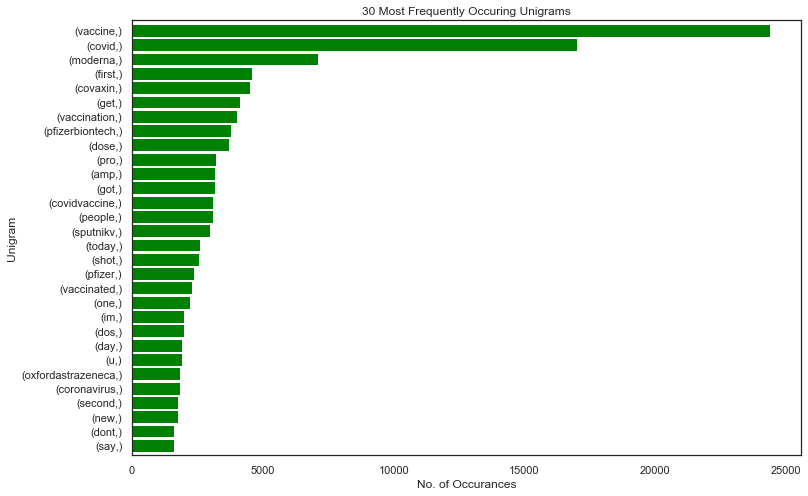

In [49]:
#Plot Unigram
unigram.sort_values().plot.barh(color='green', width=.9, figsize=(12, 8))
plt.title('30 Most Frequently Occuring Unigrams')
plt.ylabel('Unigram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

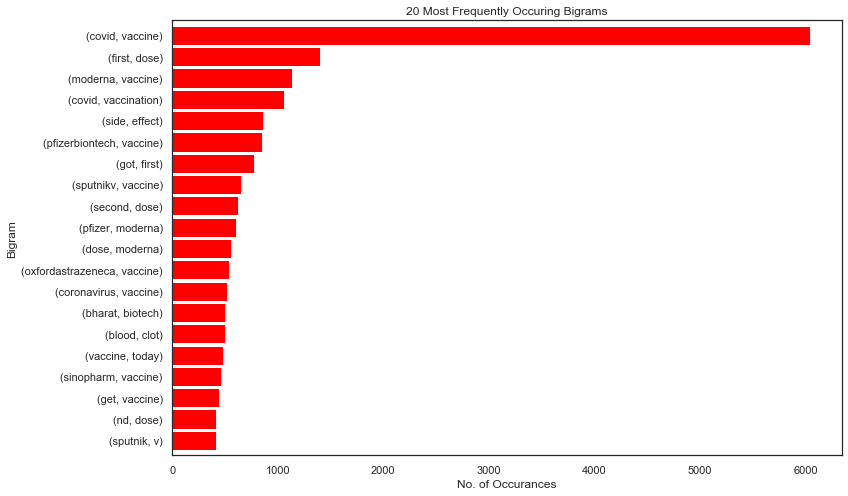

In [50]:
bigram.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

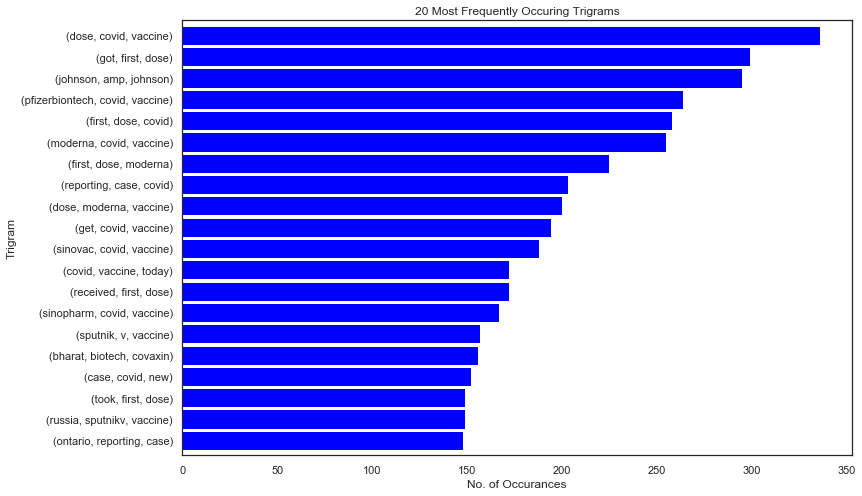

In [51]:
trigram.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('No. of Occurances')

## Scoring Sentiment
* Import VADER((Valence Aware Dictionary and sEntiment Reasoner) model and using its methods, define separate functions to return compound, positive, negative and neutral scores.

* This method combines a lexicon approach with a rule-based approach to provide a high level of accuracy when scoring sentiment on social media.The sentiment analyzer is run by passing each string to the polarity_scores method. 

* The result is a dictionary with four elements: neg, neu, pos, and compound. These represent the negative, neutral and positive sentiment as measured by the analyser plus a combination of the scores to produce an overall sentiment value.
* neg, neu, pos, are in the range 0 to 1, whereas the compound result is between -1 and +1: a negative value represents a negative sentiment value and positive value means a positive sentiment. A value around zero means that the sentiment expressed is neutral.

In [53]:
f_data = pd.DataFrame(tweet[['user', 'text','location','date']])
f_data.head()

,user,text,location,date
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,"California, USA",2021-04-11 20:48:00
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,UK,2021-04-11 20:46:00
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",Anglophone Africa,2021-04-11 20:31:00
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,"Seattle, WA 🇺🇸",2021-04-11 19:20:00
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,NaN,2021-04-11 16:48:00


In [54]:
f_data['tweet_punct'] = f_data['text'].apply(lambda x: remove_punct(x.lower()))
f_data.head(10)

,user,text,location,date,tweet_punct
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,"California, USA",2021-04-11 20:48:00,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,UK,2021-04-11 20:46:00,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",Anglophone Africa,2021-04-11 20:31:00,proeafrgt covid update africa vaccination httpstcotktwgmhvr
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,"Seattle, WA 🇺🇸",2021-04-11 19:20:00,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,NaN,2021-04-11 16:48:00,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...
5,MattBConnects,Just had my vaccine and was told its not activated until you announce it on social media 😉 \n\nM...,"CT, USA",2021-04-11 16:11:00,just had my vaccine and was told its not activated until you announce it on social media \n\nma...
6,Erst_Officer,"Still @ 15%, #Georgia continues to lag the rest of the nation in administered vaccines. I guess...","USA, PA",2021-04-11 14:45:00,still georgia continues to lag the rest of the nation in administered vaccines i guess the ge...
7,mainak_bardhan,As our knowledge is evolving about #COVID19 and #CovidVaccine keeping an eye on these will surel...,India,2021-04-11 13:41:00,as our knowledge is evolving about covid and covidvaccine keeping an eye on these will surely he...
8,FKarlEsc,Vaccination to protect against COVID-19 is non-obligatory but very important. If you are in the ...,"Yaoundé, Cameroon",2021-04-11 13:05:00,vaccination to protect against covid is nonobligatory but very important if you are in the centr...
9,sophsweet,"Seeing as COVID-19 variants predominantly came from South Africa, Brazil and Kent in the United ...","Falmouth, England",2021-04-11 12:55:00,seeing as covid variants predominantly came from south africa brazil and kent in the united king...


In [55]:
sid = SIA()
f_data['sentiments'] = f_data['text'].apply(lambda x: sid.polarity_scores(' '.join(re.findall(r'\w+',x))))

# Obtaining NLTK compound score
f_data['nltk_cmp_score'] = f_data['sentiments'].apply(lambda score_dict: score_dict['compound'])


f_data['Positive Sentiment'] = f_data['sentiments'].apply(lambda x: x['pos']+1*(10**-6)) 
f_data['Neutral Sentiment'] =f_data['sentiments'].apply(lambda x: x['neu']+1*(10**-6))
f_data['Negative Sentiment'] = f_data['sentiments'].apply(lambda x: x['neg']+1*(10**-6))

In [56]:
f_data.head()

,user,text,location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment
0,_mrsyl,Just heard that some antivax are planning to fake the Covid vaccination cards. And guess what?? ...,"California, USA",2021-04-11 20:48:00,just heard that some antivax are planning to fake the covid vaccination cards and guess what rep...,"{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4767}",-0.4767,0.000001,0.838001,0.162001
1,SustainUKorg,Another good day in terms of covid in the UK. Record 2nd jabs and therefore full vaccination. ...,UK,2021-04-11 20:46:00,another good day in terms of covid in the uk record nd jabs and therefore full vaccination onl...,"{'neg': 0.101, 'neu': 0.859, 'pos': 0.041, 'compound': -0.431}",-0.4310,0.041001,0.859001,0.101001
2,ProMED_EAFR,"PRO/EAFR&gt; COVID-19 update (46): Africa, vaccination https://t.co/tKtwg4MHVr",Anglophone Africa,2021-04-11 20:31:00,proeafrgt covid update africa vaccination httpstcotktwgmhvr,"{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2732}",0.2732,0.160001,0.840001,0.000001
3,FT__Dan,Hey @statnews: the EEOC issued guidance in DECEMBER saying that no current law would prohibit em...,"Seattle, WA 🇺🇸",2021-04-11 19:20:00,hey statnews the eeoc issued guidance in december saying that no current law would prohibit empl...,"{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.296}",-0.2960,0.000001,0.941001,0.059001
4,Upstart555Mark,@escape1979uk @ToneVays Wait so you’re admitting that the Covid vaccine doesn’t work...so that’s...,NaN,2021-04-11 16:48:00,escapeuk tonevays wait so youre admitting that the covid vaccine doesnt workso thats why you hav...,"{'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.2732}",-0.2732,0.000001,0.955001,0.045001


### Distribution of Sentiments

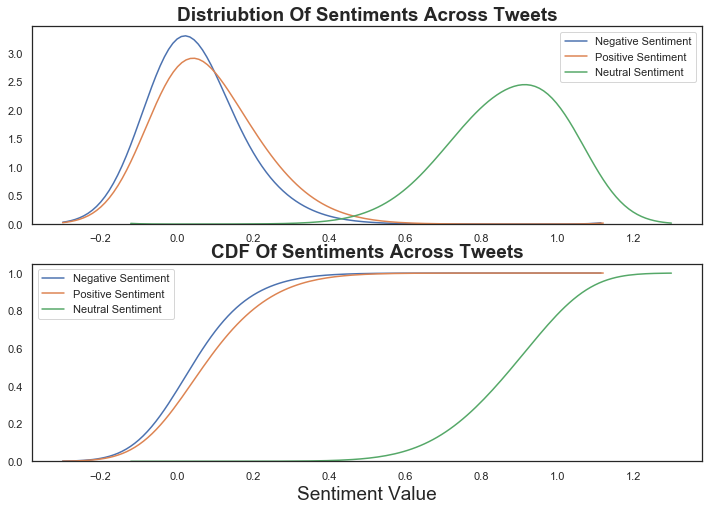

In [57]:
plt.subplot(2,1,1)
plt.title('Distriubtion Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(f_data['Negative Sentiment'],bw=0.1)
sns.kdeplot(f_data['Positive Sentiment'],bw=0.1)
sns.kdeplot(f_data['Neutral Sentiment'],bw=0.1)
plt.subplot(2,1,2)

#estimate a cumulative distribution function
plt.title('CDF Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(f_data['Negative Sentiment'],bw=0.1,cumulative=True)
sns.kdeplot(f_data['Positive Sentiment'],bw=0.1,cumulative=True)
sns.kdeplot(f_data['Neutral Sentiment'],bw=0.1,cumulative=True)
plt.xlabel('Sentiment Value',fontsize=19)
plt.show()

A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, analagous to a histogram. KDE represents the data using a continuous probability density curve in one or more dimensions

In [58]:
#Sorting And Feature Engineering
f_data = f_data.sort_values(by='date')

In [60]:
ft_data=f_data.copy()
ft_data['date'] = pd.to_datetime(f_data['date']).dt.date
ft_data['year'] = pd.DatetimeIndex(ft_data['date']).year
ft_data['month'] = pd.DatetimeIndex(ft_data['date']).month
ft_data['day'] = pd.DatetimeIndex(ft_data['date']).day

In [61]:
ft_data

,user,text,location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day
12526,Daily News Egypt,#FDA authorizes #PfizerBioNTech #coronavirus vaccine for emergency use\nhttps://t.co/VZ6bDPbbPG,Egypt,2020-12-12,fda authorizes pfizerbiontech coronavirus vaccine for emergency use\nhttpstcovzbdpbbpg,"{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}",-0.3818,0.000001,0.794001,0.206001,2020,12,12
12525,City A.M.,Trump announces #vaccine rollout 'in less than 24 hours'\n\nThe first Americans will be vaccinat...,"London, England",2020-12-12,trump announces vaccine rollout in less than hours\n\nthe first americans will be vaccinated ag...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12524,mystic,#CovidVaccine #Pfizer-BioNTech COVID-19 #PfizerBioNTech #COVID19 #CapeTown https://t.co/uCpwv0S4nl,NaN,2020-12-12,covidvaccine pfizerbiontech covid pfizerbiontech covid capetown httpstcoucpwvsnl,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12523,KHuntson,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#PfizerBioNTech \n#CovidVaccine \n\nhttps://t.co/V0m...,USA🇺🇸,2020-12-12,fact sheet for recipients and caregivers\n\npfizerbiontech \ncovidvaccine \n\nhttpstcovmnvtwj,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12522,"Party politics isn't working for anyone, anywhere",@mirekR9 @sputnikvaccine @AstraZeneca it's the only one which doesn't have any side effects \n\n...,"Wales, United Kingdom",2020-12-12,mirekr sputnikvaccine astrazeneca its the only one which doesnt have any side effects \n\nthe pf...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49484,samaveryquinn,"👀👀👀 Full FDA approval would make it much easier for colleges/ universities, businesses, the mili...",North Carolina,2021-05-04,full fda approval would make it much easier for colleges universities businesses the military e...,"{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.7096}",0.7096,0.219001,0.781001,0.000001,2021,5,4
49483,PfizerEUPolicy,Here's the latest @ECDC_EU report on #vaccination and the potential the rollout holds for lifti...,"Brussels, Belgium",2021-05-04,heres the latest ecdceu report on vaccination and the potential the rollout holds for lifting t...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2021,5,4
49583,PfizerEUPolicy,Here's the latest @ECDC_EU report on #vaccination and the potential the rollout holds for lifti...,"Brussels, Belgium",2021-05-04,heres the latest ecdceu report on vaccination and the potential the rollout holds for lifting t...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2021,5,4
49582,AFCC_Esq,"The weekly #coronavirus news roundup tackles the likely impossibility of #HerdImmunity, the vacc...",Fort Llatikcuf AZ. I shit MAGA-turds even more than Donut Twitter donut holes. #StillWithHer McK...,2021-05-04,the weekly coronavirus news roundup tackles the likely impossibility of herdimmunity the vaccina...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.25}",-0.2500,0.000001,0.909001,0.091001,2021,5,4


### Daily Distribution of Sentiments over time

Divided into 3 partitions and calculated the mean and std deviations for each

In [62]:
f_data=f_data.reset_index().drop(columns=['index'])
#Dividing into 3 partitions and calculating the mean and std deviations for each
partitions = []
partitions.append(f_data.loc[44:np.round(len(f_data)/3,0)-1,:])
partitions.append(f_data.loc[np.round(len(f_data)/3,0):2*int(len(f_data)/3)-1,:])
partitions.append(f_data.loc[2*np.round(len(f_data)/3,0):3*int(len(f_data)/3)-1,:])


#Create Negative and positive mean & std deviation
neg_part_means =[]
neg_part_std   =[]
pos_part_means =[]
pos_part_std   =[]
for part in partitions:
    neg_part_means.append(part['Negative Sentiment'].mean())
    neg_part_std.append(part['Negative Sentiment'].std())
    pos_part_means.append(part['Positive Sentiment'].mean())
    pos_part_std.append(part['Positive Sentiment'].std())
#Convert to DF
res_df = pd.DataFrame({'Positive Sentiment Mean':pos_part_means,'Negative Sentiment Mean':neg_part_means,'Positive Sentiment SD':pos_part_std,'Negative Sentiment SD':neg_part_std},
                     index = [f'Partition_{i}' for i in range(1,4)])


#print(res_df)

#transpose of matrix
res_df = res_df.T

#change column names
res_df = pd.DataFrame(res_df.values,columns=res_df.columns,index=['Positive Sentiment','Negative Sentiment','Positive Sentiment','Negative Sentiment'])
res_df = pd.concat([res_df.iloc[:2,:],res_df.iloc[2:,:]],axis=1)
res_df.columns = ['Partition_1_Mean','Partition_2_Mean','Partition_3_Mean','Partition_1_SD','Partition_2_SD','Partition_3_SD']
res_df

,Partition_1_Mean,Partition_2_Mean,Partition_3_Mean,Partition_1_SD,Partition_2_SD,Partition_3_SD
Positive Sentiment,0.080436,0.08046,0.083064,0.107181,0.109171,0.093960
Negative Sentiment,0.038032,0.03931,0.065385,0.075490,0.077117,0.090232


In [63]:
fig = make_subplots(rows=3, cols=2)

for idx,prt in enumerate(partitions):
    fig.add_trace(go.Scatter(x=prt['date'], y=prt['Positive Sentiment'],name=f'Positive Part {idx+1}'),
    row=idx+1, col=1)
    fig.add_trace(go.Scatter(x=prt['date'], y=prt['Negative Sentiment'],name=f'Negative Part {idx+1}'),
    row=idx+1, col=2)

fig.update_layout(height=600, width=900, title_text="Distibution Of Daily Sentiments Over Time Line For Each Partition")
fig.show()

Dec 2020- March 2021 higher density of positive tweets
March & April density of daily tweets seem to be less 

### Sentiment Average Change With Time

In [64]:
b_date_mean = ft_data.groupby(by='date').mean().reset_index()
b_date_std = ft_data.groupby(by='date').std().reset_index()

#date as common x axis
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Daily Average Positive Sentiment',  'Daily Average Negative Sentiment'))

#using plotly for graph: positive sentiment
fig.add_trace(go.Scatter(x=b_date_mean['date'], y=b_date_mean['Positive Sentiment'],name='Positive Sentiment Mean'),row=1, col=1)

#positive mean line
fig.add_shape(type="line",
    x0=b_date_mean['date'].values[0], y0=b_date_mean['Positive Sentiment'].mean(), x1=b_date_mean['date'].values[-1], y1=b_date_mean['Positive Sentiment'].mean(),
    line=dict(color="Red",
              dash="dashdot",
             ),
              name='Mean'
            )

#using plotly for graph: negative sentiment
fig.add_trace(go.Scatter(x=b_date_mean['date'], y=b_date_mean['Negative Sentiment'],name='Negative Sentiment Mean'),
              row=2, col=1
)

#negative mean
fig.add_shape(type="line",
    x0=b_date_mean['date'].values[0], y0=b_date_mean['Negative Sentiment'].mean(), x1=b_date_mean['date'].values[-1], y1=b_date_mean['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x2', 
        yref='y2'
)

fig['layout']['xaxis2']['title'] = 'Date'
fig.update_layout(height=700, width=900, title_text="Sentiment Average Change With Time")
fig.show()

From 18 December to December 29 there is a decline in the strength of the average negative sentiment, this could possibly be becasue the U.S. Food and Drug Administration issued authorization for the use of Pfizer-BioNTech vaccine on Dec 14,& Moderna on Dec 18

In [65]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Daily Deviation in Positive Sentiment',  'Daily Deviation in Negative Sentiment'))

#STD for positive sentiment
fig.add_trace(
    go.Scatter(x=b_date_std['date'], y=b_date_std['Positive Sentiment'],name='Positive Sentiment SD'),row=1, col=1)


#mean line
fig.add_shape(type="line",
    x0=b_date_std['date'].values[0], y0=b_date_std['Positive Sentiment'].mean(), x1=b_date_std['date'].values[-1], y1=b_date_std['Positive Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x1', 
        yref='y1'
)

#STD for negative sentiment
fig.add_trace(
    go.Scatter(x=b_date_std['date'], y=b_date_std['Negative Sentiment'],name='Negative Sentiment SD'),
    row=2, col=1
)

#negative mean
fig.add_shape(type="line",
    x0=b_date_std['date'].values[0], y0=b_date_std['Negative Sentiment'].mean(), x1=b_date_std['date'].values[-1], y1=b_date_std['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        dash="dashdot",
    ),
        name='Mean',
        xref='x2', 
        yref='y2'
)

fig['layout']['xaxis2']['title'] = 'Date'
fig.update_layout(height=700, width=900, title_text="Sentiment Deviation Change With Time")
fig.show()

The daily standard deviation of the positive and negative sentiments become more fluctuating , from March 24 to April 6 there seems to be a decline in the collected number of tweets

In [66]:
ft_data.head()

,user,text,location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day
12526,Daily News Egypt,#FDA authorizes #PfizerBioNTech #coronavirus vaccine for emergency use\nhttps://t.co/VZ6bDPbbPG,Egypt,2020-12-12,fda authorizes pfizerbiontech coronavirus vaccine for emergency use\nhttpstcovzbdpbbpg,"{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}",-0.3818,0.000001,0.794001,0.206001,2020,12,12
12525,City A.M.,Trump announces #vaccine rollout 'in less than 24 hours'\n\nThe first Americans will be vaccinat...,"London, England",2020-12-12,trump announces vaccine rollout in less than hours\n\nthe first americans will be vaccinated ag...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12524,mystic,#CovidVaccine #Pfizer-BioNTech COVID-19 #PfizerBioNTech #COVID19 #CapeTown https://t.co/uCpwv0S4nl,NaN,2020-12-12,covidvaccine pfizerbiontech covid pfizerbiontech covid capetown httpstcoucpwvsnl,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12523,KHuntson,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#PfizerBioNTech \n#CovidVaccine \n\nhttps://t.co/V0m...,USA🇺🇸,2020-12-12,fact sheet for recipients and caregivers\n\npfizerbiontech \ncovidvaccine \n\nhttpstcovmnvtwj,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12
12522,"Party politics isn't working for anyone, anywhere",@mirekR9 @sputnikvaccine @AstraZeneca it's the only one which doesn't have any side effects \n\n...,"Wales, United Kingdom",2020-12-12,mirekr sputnikvaccine astrazeneca its the only one which doesnt have any side effects \n\nthe pf...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,0.000001,1.000001,0.000001,2020,12,12


In [67]:
neutral_thresh = 0.05

In [68]:
# Categorize scores into the sentiments of positive, neutral or negative using compund
ft_data['nltk_sentiment'] = ft_data['nltk_cmp_score'].apply(lambda c: 'Positive' if c >= neutral_thresh else ('Negative' if c <= -(neutral_thresh) else 'Neutral'))

In [69]:
ft_data['nltk_cmp_score'].describe()

count    50351.000000
mean         0.093042
std          0.403064
min         -0.982000
25%          0.000000
50%          0.000000
75%          0.421500
max          0.980400
Name: nltk_cmp_score, dtype: float64

In [72]:
# Define function to get value counts
def get_value_counts(col_name):
    count = pd.DataFrame(ft_data[col_name].value_counts())
    percentage = pd.DataFrame(ft_data[col_name].value_counts(normalize=True).mul(100))
    value_counts_df = pd.concat([count, percentage], axis = 1)
    value_counts_df = value_counts_df.reset_index()
    value_counts_df.columns = ['sentiment', 'counts', 'percentage']
    value_counts_df.sort_values('sentiment', inplace = True)
    value_counts_df['percentage'] = value_counts_df['percentage'].apply(lambda x: round(x,2))
    value_counts_df = value_counts_df.reset_index(drop = True)
    return value_counts_df

In [73]:
nltk_sentiment_df = get_value_counts('nltk_sentiment')
nltk_sentiment_df

,sentiment,counts,percentage
0,Negative,11416,22.67
1,Neutral,18718,37.18
2,Positive,20217,40.15


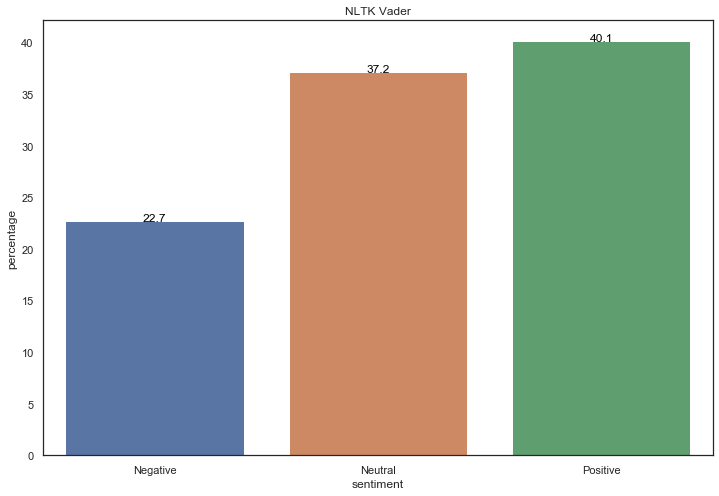

In [74]:
ax = sns.barplot(x="sentiment", y="percentage", data=nltk_sentiment_df)
ax.set_title('NLTK Vader')

for index, row in nltk_sentiment_df.iterrows():
    ax.text(row.name,row.percentage, round(row.percentage,1), color='black', ha="center")

In [75]:
Most_Positive = ft_data[ft_data['Positive Sentiment'].between(0.4,1)]
Most_Negative = ft_data[ft_data['Negative Sentiment'].between(0.25,1)]

In [76]:
Most_Positive

,user,text,location,date,tweet_punct,sentiments,nltk_cmp_score,Positive Sentiment,Neutral Sentiment,Negative Sentiment,year,month,day,nltk_sentiment
12705,Lel B.,"@JoeBiden @KamalaHarris Thanks to you both for bringing in fresh air, positivity and God’s hand ...",United States,2020-12-13,joebiden kamalaharris thanks to you both for bringing in fresh air positivity and gods hand and ...,"{'neg': 0.0, 'neu': 0.552, 'pos': 0.448, 'compound': 0.9153}",0.9153,0.448001,0.552001,0.000001,2020,12,13,Positive
12645,Sivateja Mandava,"I’m due to get the vaccine on Tuesday, super thrilled!\n#Pfizer #PfizerBioNTech #CoronavirusVaccine","Troy, Michigan; Serial ✈️",2020-12-14,im due to get the vaccine on tuesday super thrilled\npfizer pfizerbiontech coronavirusvaccine,"{'neg': 0.0, 'neu': 0.595, 'pos': 0.405, 'compound': 0.7783}",0.7783,0.405001,0.595001,0.000001,2020,12,14,Positive
12625,Anita Raja,Excited about tomorrow \nSo honoured to be part to this exciting team administering in primary c...,Birmingham UK,2020-12-14,excited about tomorrow \nso honoured to be part to this exciting team administering in primary c...,"{'neg': 0.0, 'neu': 0.555, 'pos': 0.445, 'compound': 0.916}",0.9160,0.445001,0.555001,0.000001,2020,12,14,Positive
12572,Aru Sivananthan 🇬🇧 🇦🇺,Privileged be offered the #PfizerBioNTech vaccine. I would encourage everyone to take it up. It’...,London,2020-12-14,privileged be offered the pfizerbiontech vaccine i would encourage everyone to take it up itll h...,"{'neg': 0.0, 'neu': 0.596, 'pos': 0.404, 'compound': 0.8885}",0.8885,0.404001,0.596001,0.000001,2020,12,14,Positive
12924,Amy Summy,Take a breath and celebrate what happened today. Democracy won. Our constitution won. #PfizerBi...,NaN,2020-12-15,take a breath and celebrate what happened today democracy won our constitution won pfizerbionte...,"{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.9325}",0.9325,0.483001,0.517001,0.000001,2020,12,15,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,_kelvb_,jus got the J&amp;J Vaccine... i feel great ! 🙏🏼,"Paterson, New Jersey",2021-04-14,jus got the jampj vaccine i feel great,"{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}",0.6249,0.406001,0.594001,0.000001,2021,4,14,Positive
855,KSBY,Fauci hopes pause in Johnson &amp; Johnson vaccine leads to increased confidence in vaccine safe...,"Central Coast, California",2021-04-14,fauci hopes pause in johnson amp johnson vaccine leads to increased confidence in vaccine safety...,"{'neg': 0.0, 'neu': 0.56, 'pos': 0.44, 'compound': 0.875}",0.8750,0.440001,0.560001,0.000001,2021,4,14,Positive
775,sandiemullin,@ethannichtern I love Vaccination Twitter!,NaN,2021-04-14,ethannichtern i love vaccination twitter,"{'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.6369}",0.6369,0.583001,0.417001,0.000001,2021,4,14,Positive
502,Jo_Summie,Praying for all of my friends and loved ones who got the vaccine,In the moment,2021-04-14,praying for all of my friends and loved ones who got the vaccine,"{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.8591}",0.8591,0.487001,0.513001,0.000001,2021,4,14,Positive


### Common words among Positive and Negative tweets

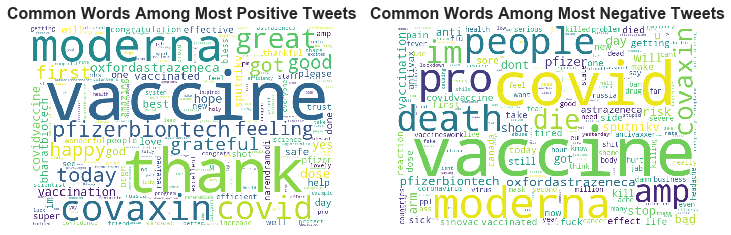

In [77]:
Most_Positive_text = ' '.join(Most_Positive.tweet_punct)
Most_Negative_text = ' '.join(Most_Negative.tweet_punct)


pwc = WordCloud(width=600,height=400,collocations = False,background_color='white').generate(Most_Positive_text)
nwc = WordCloud(width=600,height=400,collocations = False,background_color='white').generate(Most_Negative_text)

plt.subplot(1,2,1)
plt.title('Common Words Among Most Positive Tweets',fontsize=16,fontweight='bold')
plt.imshow(pwc)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Common Words Among Most Negative Tweets',fontsize=16,fontweight='bold')
plt.imshow(nwc)
plt.axis('off')

plt.show()

### Top 10 coomon words

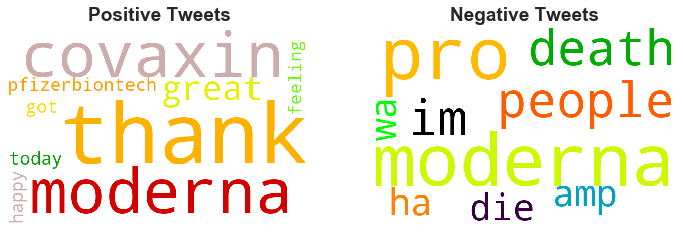

In [78]:
l_t = Most_Positive_text
new_stopwords = ['vaccine', 'covid']

stopword = nltk.corpus.stopwords.words('english') + new_stopwords 

w1_dict = dict()
for word in l_t.split():
    w= word.strip()
    wn = nltk.stem.WordNetLemmatizer()
    w= wn.lemmatize(w)
    if w in stopword:
        continue
    else:
        w1_dict[w] = w1_dict.get(w,0)+1
w1_dict = {k: v for k, v in sorted(w1_dict.items(), key=lambda item: item[1],reverse=True)}

l_t = Most_Negative_text
w2_dict = dict()
for word in l_t.split():
    w= word.strip()
    wn = nltk.stem.WordNetLemmatizer()
    w= wn.lemmatize(w)
    if w in stopword:
        continue
    else:
        w2_dict[w] = w2_dict.get(w,0)+1
w2_dict = {k: v for k, v in sorted(w2_dict.items(), key=lambda item: item[1],reverse=True)}

top_10_pos = list(w1_dict.keys())[:10]
top_10_neg = list(w2_dict.keys())[:10]

plt.subplot(1,2,1)
w_c = WordCloud(width=600,height=400,collocations = False,colormap='nipy_spectral',background_color='white').generate(' '.join(top_10_pos))
plt.title('Positive Tweets',fontsize=19,fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.subplot(1,2,2)
w_c = WordCloud(width=600,height=400,collocations = False,colormap='nipy_spectral',background_color='white').generate(' '.join(top_10_neg))
plt.title('Negative Tweets',fontsize=19,fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.show()

### Locations with Positive & negatice Tweets

In [ ]:
# fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Top 10 Most Positive Locations Contributes',  'Top 10 Most Negative Locations Contributes'))

fig.add_trace(
    go.Bar(x=Most_Positive.location.value_counts()[:10].index, y=Most_Positive.location.value_counts()[:10].values,name='Number Of Tweets'),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=Most_Negative.location.value_counts()[:10].index, y=Most_Negative.location.value_counts()[:10].values,name='Number Of Tweets'),
    row=2, col=1
)

fig.update_layout(height=700, width=900)
fig.show()

London is seen to have high number of positive tweets
Toronto ,Canada seems to have high number of positive tweets

## Conclusion

* The dominant sentiment of covid vaccine-related tweets are positive.
* The tweets tend to be more positive than negative on average.
* There was a trend of decreasing negative sentiment strength from the 18th of December to the 27th, which was when the  started vaccination.
* There are recurring words both in the extremely negative and extremely positive tweets. 


## Future Work
* Conduct the analysis on a larger amount of tweets
* Compare text analysis results with other packages eg, Textblob
* Improve the model to design a suitable cut off for positive and negative tweets, PyMC3 is a Python package for Bayesian statistical modeling and Probabilistic Machine Learning which focuses on advanced Markov chain Monte Carlo and variational fitting algorithms.
